In [12]:
# Import necessary libraries
import os
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.applications import VGG16 as VGG16
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

In [2]:
data_directory = 'C:/Users/parit/Desktop/DLAssignment/logos_v3_mini/logos3'

# List of food chain class names (subdirectories in your dataset directory)
food_classes = ['Burger King', 'KFC', 'McDonalds', 'Starbucks', 'Subway', 'Other']

# Initialize empty lists to store data and labels
data_list = []
labels_list = []

# Batch size determines the number of samples that will be used in each iteration during training.
batch_size = 128

print(data_directory,"\n")

print(food_classes)

C:/Users/parit/Desktop/DLAssignment/logos_v3_mini/logos3 

['Burger King', 'KFC', 'McDonalds', 'Starbucks', 'Subway', 'Other']


# q1

In [3]:

# Load and preprocess the data from both "train" and "test" directories
for data_split in ['train', 'test']:
    for food_class in food_classes:
        class_directory = os.path.join(data_directory, data_split, food_class)

        for image_filename in os.listdir(class_directory):
            if image_filename.endswith('.jpg'):
                image_path = os.path.join(class_directory, image_filename)
                image_data = Image.open(image_path)

                # Resize the image to your desired dimensions (e.g., 224x224)
                image_data = image_data.resize((224, 224))

                # Convert the image to a NumPy array and normalize pixel values
                image_data = np.array(image_data) / 255.0

                data_list.append(image_data)
                labels_list.append(food_class)
                
print("\n", labels_list, "\n")
print("\n", data_list, "\n")
print("\n", image_data, "\n")
print("\n", class_directory, "\n")


 ['Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# q2

In [4]:
# Split the data into training and validation sets (80% training, 20% validation)
train_data, validation_data, train_labels, validation_labels = train_test_split(data_list, labels_list, test_size=0.2, random_state=42)

# Convert the data and labels to NumPy arrays
train_data = np.array(train_data)
validation_data = np.array(validation_data)
train_labels = np.array(train_labels)
validation_labels = np.array(validation_labels)

# Print the shapes of the training and validation sets
print("Training data shape:", train_data.shape)
print("Training labels shape:", train_labels.shape)
print("Validation data shape:", validation_data.shape)
print("Validation labels shape:", validation_labels.shape)


Training data shape: (1838, 224, 224, 3)
Training labels shape: (1838,)
Validation data shape: (460, 224, 224, 3)
Validation labels shape: (460,)


# q3

In [5]:
# Create data generators for training and validation with data augmentation
data_generator_train = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

data_generator_validation = ImageDataGenerator(rescale=1.0/255.0)

# Convert labels to one-hot encoding for both training and validation
label_encoding = {food_class: index for index, food_class in enumerate(food_classes)}
encoded_train_labels = [label_encoding[label] for label in train_labels]
encoded_validation_labels = [label_encoding[label] for label in validation_labels]
num_classes = len(food_classes)

encoded_train_targets = to_categorical(encoded_train_labels, num_classes)
encoded_validation_targets = to_categorical(encoded_validation_labels, num_classes)

# Print relevant information for debugging
print("data_generator_train:", data_generator_train, "\n")
print("data_generator_validation:", data_generator_validation, "\n")
print("label_encoding:", label_encoding, "\n")
print("encoded_train_labels:", encoded_train_labels, "\n")
print("encoded_validation_labels:", encoded_validation_labels, "\n")
print("num_classes:", num_classes, "\n")
print("encoded_train_targets:", encoded_train_targets, "\n")
print("encoded_validation_targets:", encoded_validation_targets, "\n")

data_generator_train: <keras.src.preprocessing.image.ImageDataGenerator object at 0x0000023B56D08070> 

data_generator_validation: <keras.src.preprocessing.image.ImageDataGenerator object at 0x0000023B56D080D0> 

label_encoding: {'Burger King': 0, 'KFC': 1, 'McDonalds': 2, 'Starbucks': 3, 'Subway': 4, 'Other': 5} 

encoded_train_labels: [5, 1, 5, 2, 0, 4, 3, 5, 1, 1, 4, 5, 5, 0, 0, 5, 0, 5, 0, 5, 3, 5, 3, 4, 5, 5, 0, 5, 5, 0, 3, 0, 1, 5, 0, 5, 3, 2, 2, 5, 2, 2, 2, 3, 5, 3, 3, 2, 5, 5, 5, 5, 5, 2, 2, 4, 5, 4, 5, 0, 1, 2, 2, 0, 5, 0, 5, 2, 5, 5, 0, 5, 5, 3, 5, 4, 2, 3, 3, 5, 0, 5, 5, 3, 5, 5, 5, 2, 5, 2, 5, 5, 2, 5, 0, 0, 5, 3, 5, 2, 5, 0, 5, 3, 5, 0, 2, 5, 5, 5, 2, 3, 5, 0, 3, 5, 2, 1, 5, 0, 5, 0, 0, 3, 3, 0, 4, 0, 5, 0, 5, 5, 0, 0, 5, 0, 3, 2, 2, 3, 3, 0, 5, 5, 5, 0, 5, 1, 0, 3, 4, 5, 2, 5, 5, 2, 2, 0, 0, 5, 3, 4, 2, 5, 5, 5, 1, 0, 5, 5, 5, 4, 5, 4, 0, 5, 5, 2, 5, 0, 5, 0, 5, 3, 2, 5, 5, 3, 5, 5, 5, 5, 5, 2, 2, 5, 5, 5, 5, 0, 2, 3, 0, 5, 3, 0, 5, 5, 0, 5, 2, 0, 5, 2, 5, 2, 0, 3, 5, 5, 

# q4

In [6]:
# q4 start

train_data_generator = data_generator_train.flow(train_data, encoded_train_targets, batch_size=batch_size)

# For the validation data, apply rescaling but not data augmentation
validation_data_generator = data_generator_validation.flow(validation_data, encoded_validation_targets, batch_size=batch_size)

# Load the pre-trained VGG-16 model (without top layers)
base_pretrained_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model (optional)
for layer in base_pretrained_model.layers:
    layer.trainable = False

print("train_data_generator:", train_data_generator, "\n")
print("validation_data_generator:", validation_data_generator, "\n")
print("base_pretrained_model:", base_pretrained_model, "\n")
print("layer:", layer, "\n")
# q4 end


train_data_generator: <keras.src.preprocessing.image.NumpyArrayIterator object at 0x0000023B56D0D670> 

validation_data_generator: <keras.src.preprocessing.image.NumpyArrayIterator object at 0x0000023B56D0D610> 

base_pretrained_model: <keras.src.engine.functional.Functional object at 0x0000023C4F5271F0> 

layer: <keras.src.layers.pooling.max_pooling2d.MaxPooling2D object at 0x0000023C4F519940> 



# q5

In [7]:
# q5 start
# Change variable names: (new - top_layer_output, old - layer_output)

# Add a new fully connected layer with the appropriate number of output nodes
top_layer_output = base_pretrained_model.output
top_layer_output = GlobalAveragePooling2D()(top_layer_output)
top_layer_output = Dense(1024, activation='relu')(top_layer_output)  # You can adjust the number of units as needed
predictions = Dense(num_classes, activation='softmax')(top_layer_output)

# Create a new model by combining the base model and the new top layers
model = Model(inputs=base_pretrained_model.input, outputs=predictions)

# Compile the model with an appropriate optimizer and loss function
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print a summary of the new model
print("Model Summary:")
model.summary()
# q5 end


Model Summary:
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 12

# q6

In [8]:
# Unfreeze some of the top layers of the pre-trained model for fine-tuning
# You can choose how many layers to unfreeze based on your specific needs
# For example, you can unfreeze the last few convolutional blocks
# In this example, we unfreeze the last two blocks (layers 15 and onwards)
for layer in base_pretrained_model.layers[15:]:
    layer.trainable = True

# Recompile the model after unfreezing some layers
# You can use a lower learning rate for fine-tuning if needed
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model with fine-tuned layers
print("Fine-tuning the model...")
model.fit(
    train_data_generator,
    steps_per_epoch=len(train_data) // batch_size,
    epochs=10,  # You can adjust the number of epochs for fine-tuning
    validation_data=validation_data_generator,
    validation_steps=len(validation_data) // batch_size
)

Fine-tuning the model...
Epoch 1/10
14/14 [==============================] - 197s 14s/step - loss: 1.6062 - accuracy: 0.3947 - val_loss: 1.5133 - val_accuracy: 0.4479
Epoch 2/10
14/14 [==============================] - 183s 13s/step - loss: 1.5143 - accuracy: 0.4550 - val_loss: 1.4851 - val_accuracy: 0.4609
Epoch 3/10
14/14 [==============================] - 185s 13s/step - loss: 1.5078 - accuracy: 0.4538 - val_loss: 1.5037 - val_accuracy: 0.4531
Epoch 4/10
14/14 [==============================] - 201s 14s/step - loss: 1.5050 - accuracy: 0.4544 - val_loss: 1.4946 - val_accuracy: 0.4531
Epoch 5/10
14/14 [==============================] - 212s 15s/step - loss: 1.4998 - accuracy: 0.4544 - val_loss: 1.4661 - val_accuracy: 0.4792
Epoch 6/10
14/14 [==============================] - 197s 14s/step - loss: 1.5076 - accuracy: 0.4526 - val_loss: 1.4657 - val_accuracy: 0.4714
Epoch 7/10
14/14 [==============================] - 200s 14s/step - loss: 1.5054 - accuracy: 0.4567 - val_loss: 1.4888 - va

# q7

In [9]:
# q7: Further Fine-tuning the pre-trained model

# Unfreeze some of the pre-trained layers (e.g., block4 and block5)
for layer in base_pretrained_model.layers:
    if 'block4' in layer.name or 'block5' in layer.name:
        layer.trainable = True

# Recompile the model (after unfreezing layers)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Calculate the number of steps per epoch for fine-tuning
steps_per_epoch_fine_tune = len(train_data) // batch_size

# Fine-tune the model
print("Further Fine-tuning the model...")
model.fit(
    train_data_generator,
    steps_per_epoch=steps_per_epoch_fine_tune,
    epochs=10,  # You can adjust the number of epochs
    validation_data=validation_data_generator
)

Further Fine-tuning the model...
Epoch 1/10
14/14 [==============================] - 307s 22s/step - loss: 1.6192 - accuracy: 0.4520 - val_loss: 1.4855 - val_accuracy: 0.4630
Epoch 2/10
14/14 [==============================] - 310s 22s/step - loss: 1.5127 - accuracy: 0.4544 - val_loss: 1.5015 - val_accuracy: 0.4630
Epoch 3/10
14/14 [==============================] - 315s 23s/step - loss: 1.4996 - accuracy: 0.4567 - val_loss: 1.4774 - val_accuracy: 0.4630
Epoch 4/10
14/14 [==============================] - 307s 22s/step - loss: 1.5114 - accuracy: 0.4468 - val_loss: 1.4820 - val_accuracy: 0.4630
Epoch 5/10
14/14 [==============================] - 330s 24s/step - loss: 1.5118 - accuracy: 0.4550 - val_loss: 1.4795 - val_accuracy: 0.4630
Epoch 6/10
14/14 [==============================] - 330s 23s/step - loss: 1.5051 - accuracy: 0.4561 - val_loss: 1.4838 - val_accuracy: 0.4630
Epoch 7/10
14/14 [==============================] - 309s 22s/step - loss: 1.5240 - accuracy: 0.4444 - val_loss: 1.4

# q8

In [10]:
# Evaluate the performance of the model using the validation set
validation_results = model.evaluate(validation_data_generator)
print("Validation Loss:", validation_results[0])
print("Validation Accuracy:", validation_results[1])

4/4 [==============================] - 38s 9s/step - loss: 1.4845 - accuracy: 0.4630
Validation Loss: 1.4845110177993774
Validation Accuracy: 0.4630434811115265


 # q9

Visualizing feature maps for layer: block1_conv1
1/1 [==============================] - 0s 48ms/step


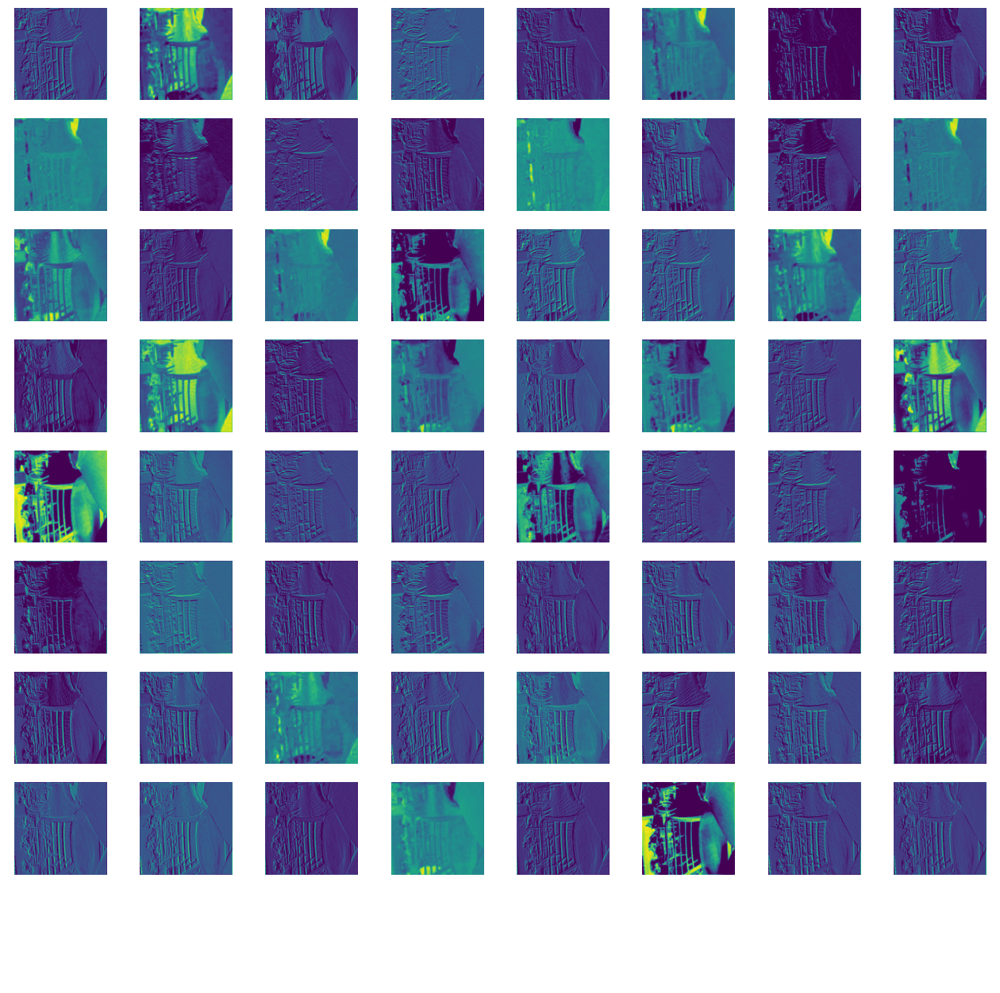

Visualizing feature maps for layer: block1_conv2
1/1 [==============================] - 0s 80ms/step


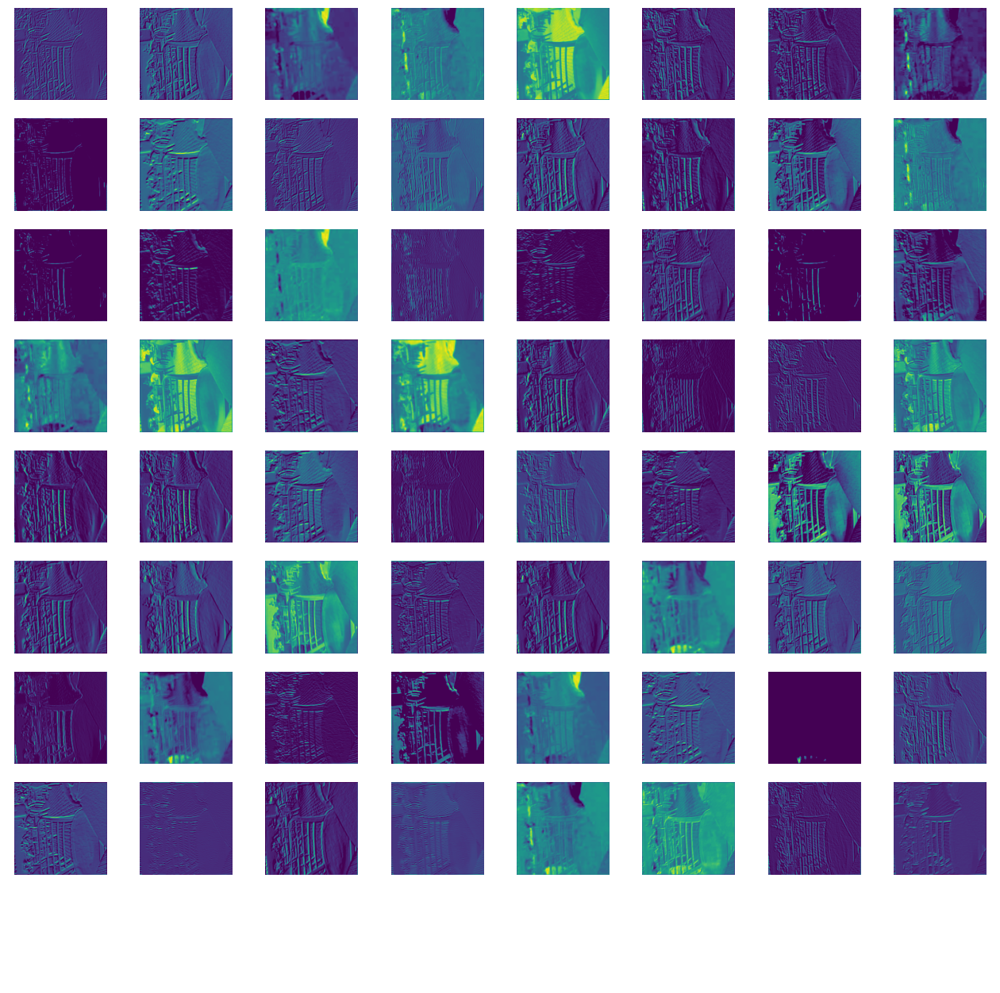

Visualizing feature maps for layer: block2_conv1
1/1 [==============================] - 0s 97ms/step


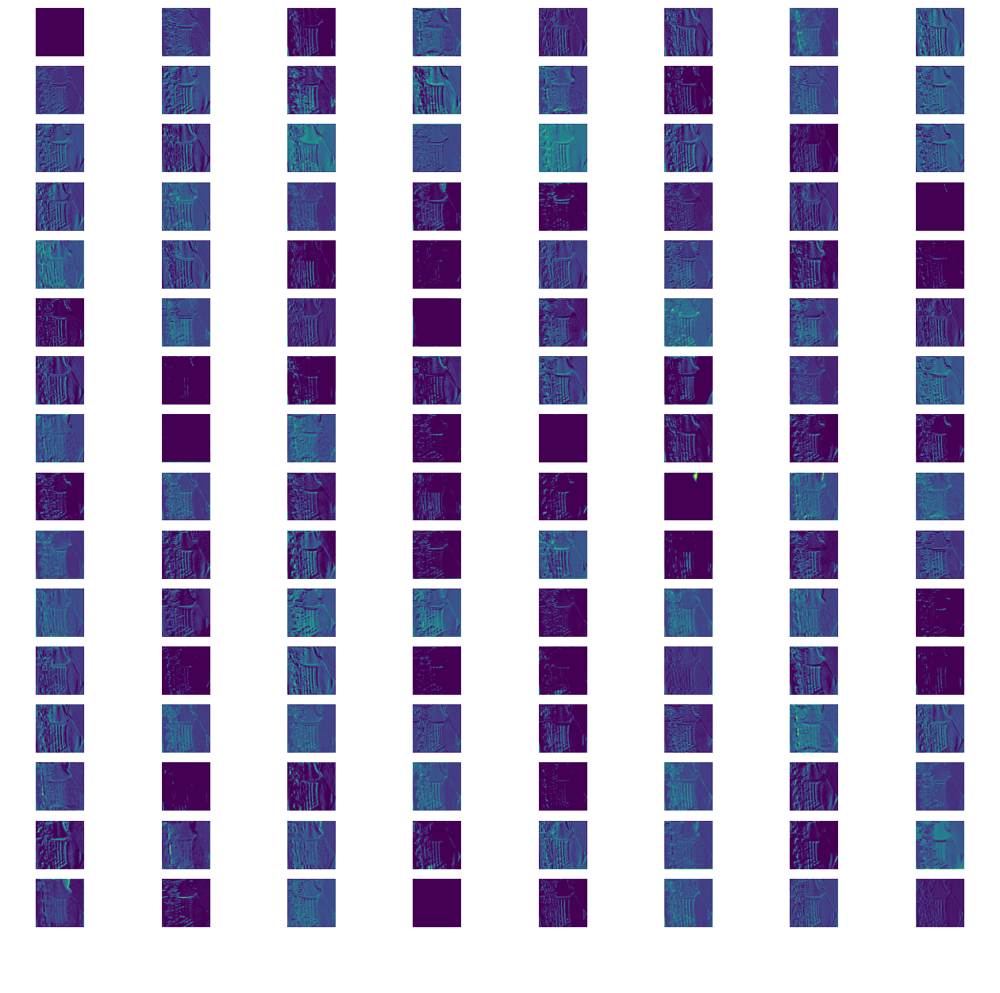

Visualizing feature maps for layer: block2_conv2
1/1 [==============================] - 0s 92ms/step


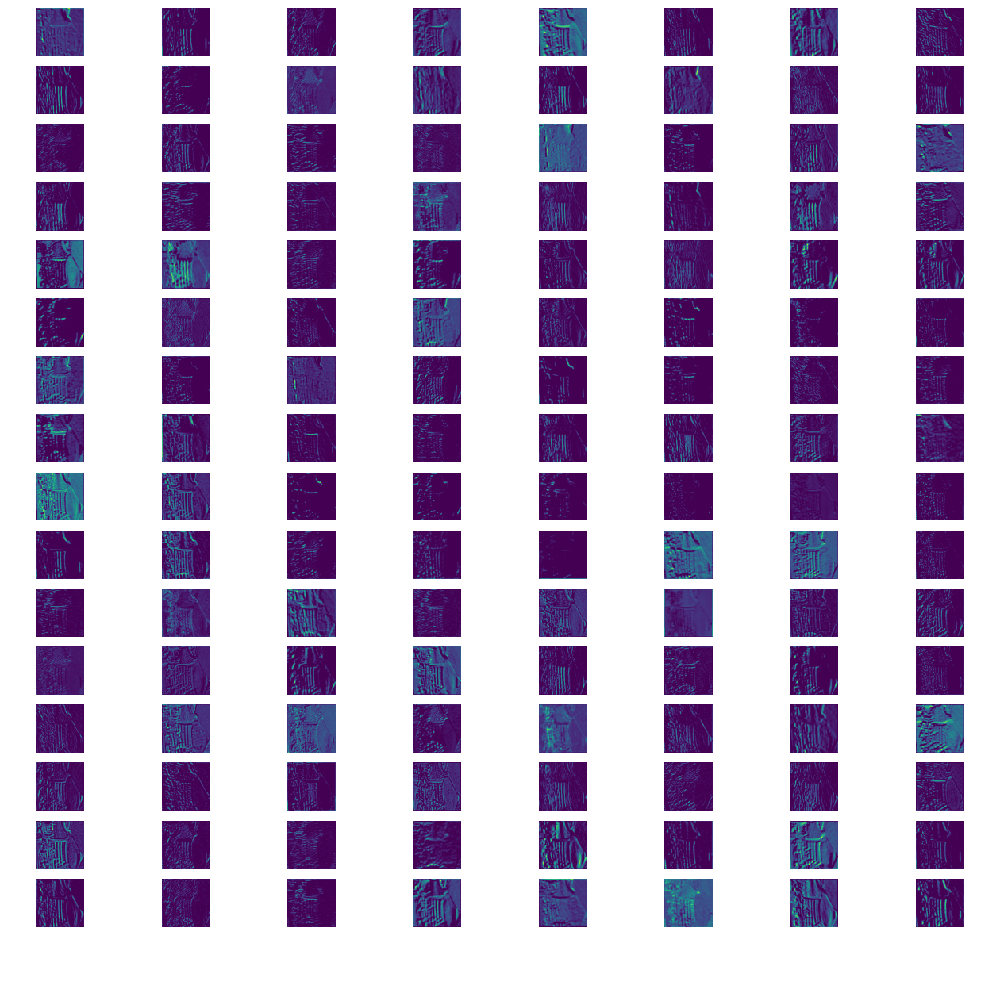

Visualizing feature maps for layer: block3_conv1
1/1 [==============================] - 0s 99ms/step


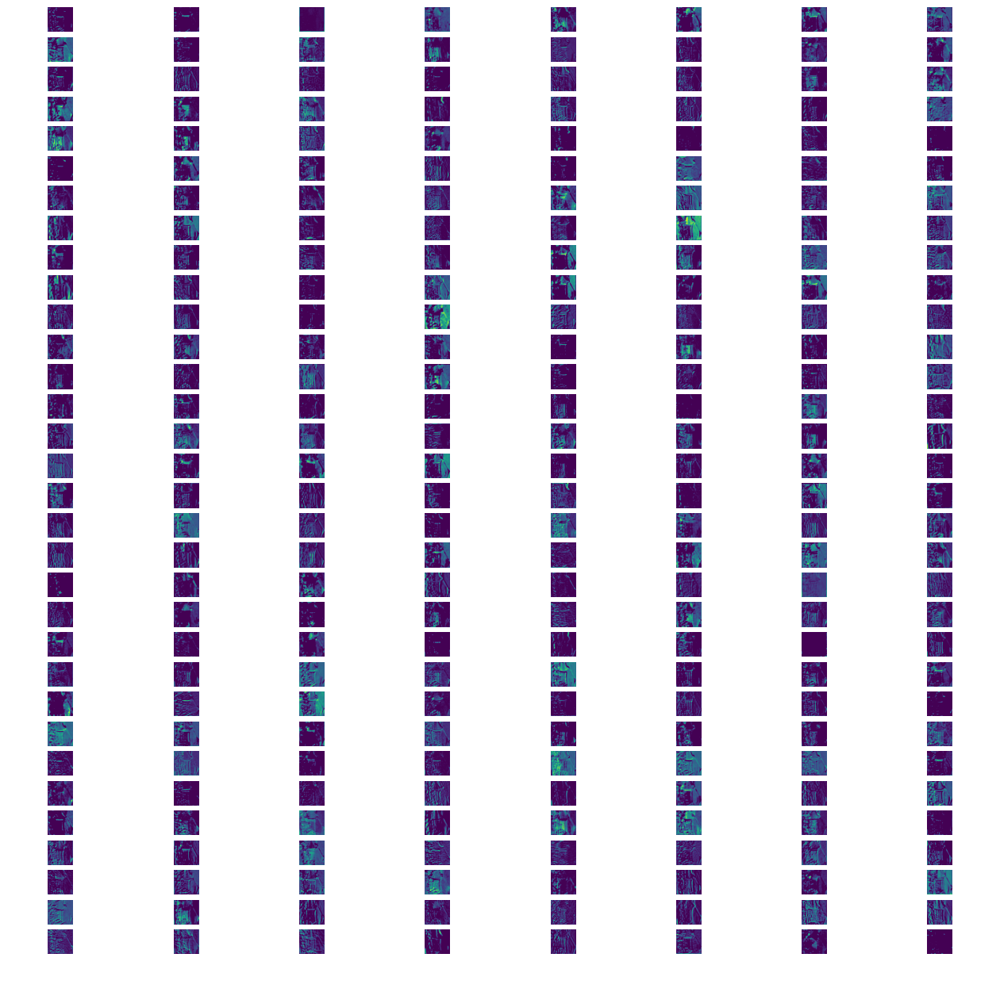

Visualizing feature maps for layer: block3_conv2
1/1 [==============================] - 0s 114ms/step


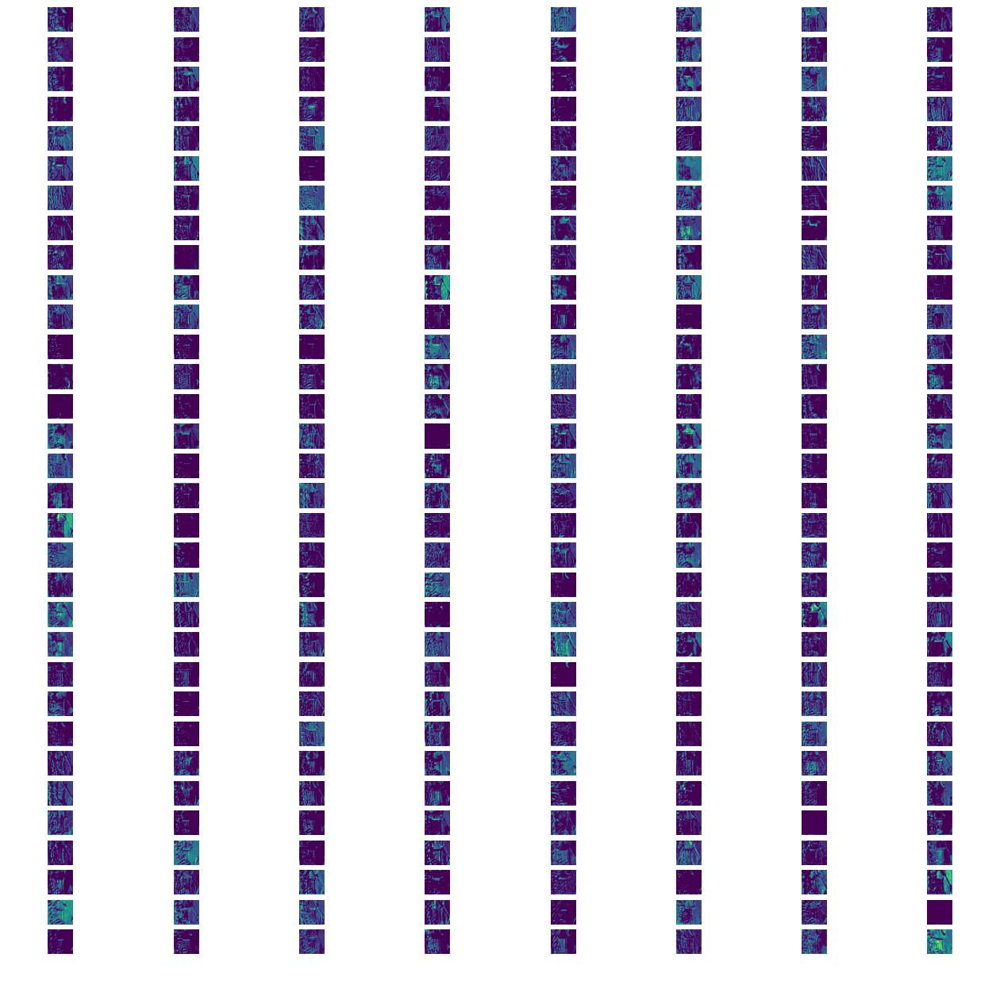

Visualizing feature maps for layer: block3_conv3
1/1 [==============================] - 0s 152ms/step


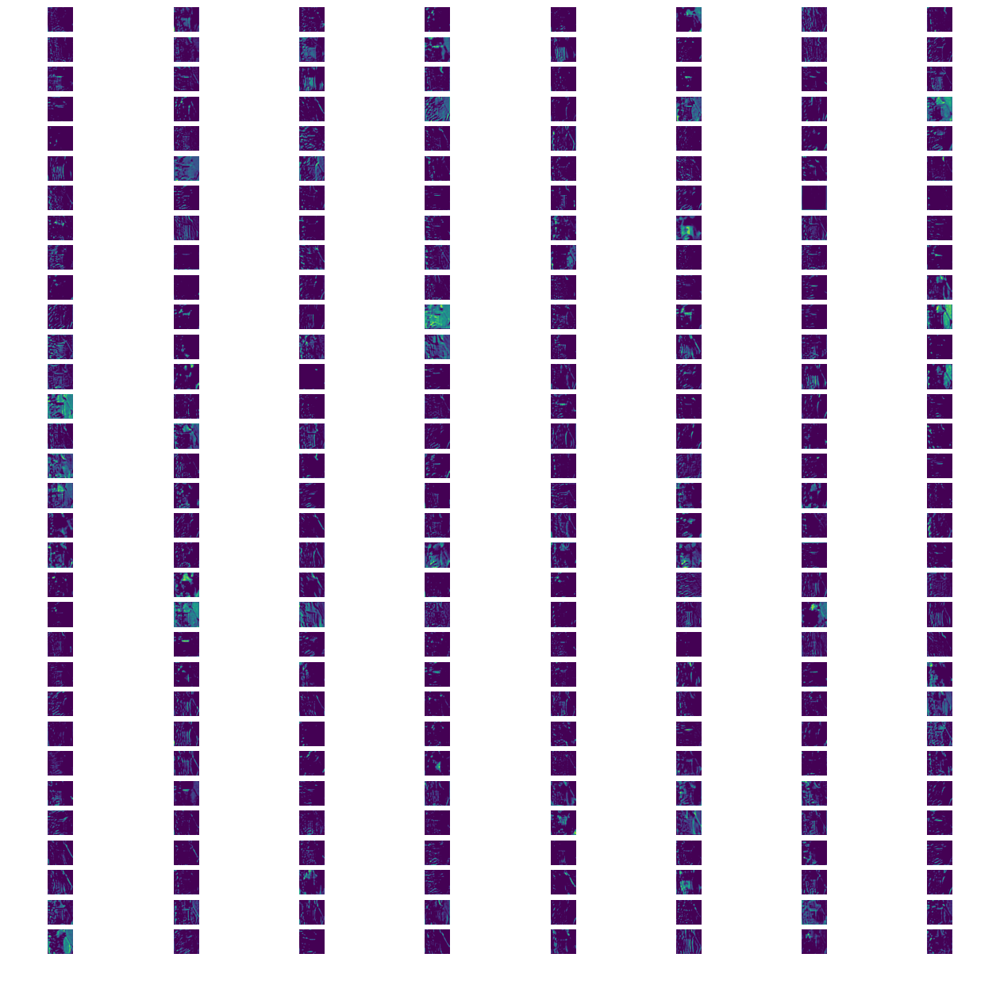

Visualizing feature maps for layer: block4_conv1
1/1 [==============================] - 0s 161ms/step


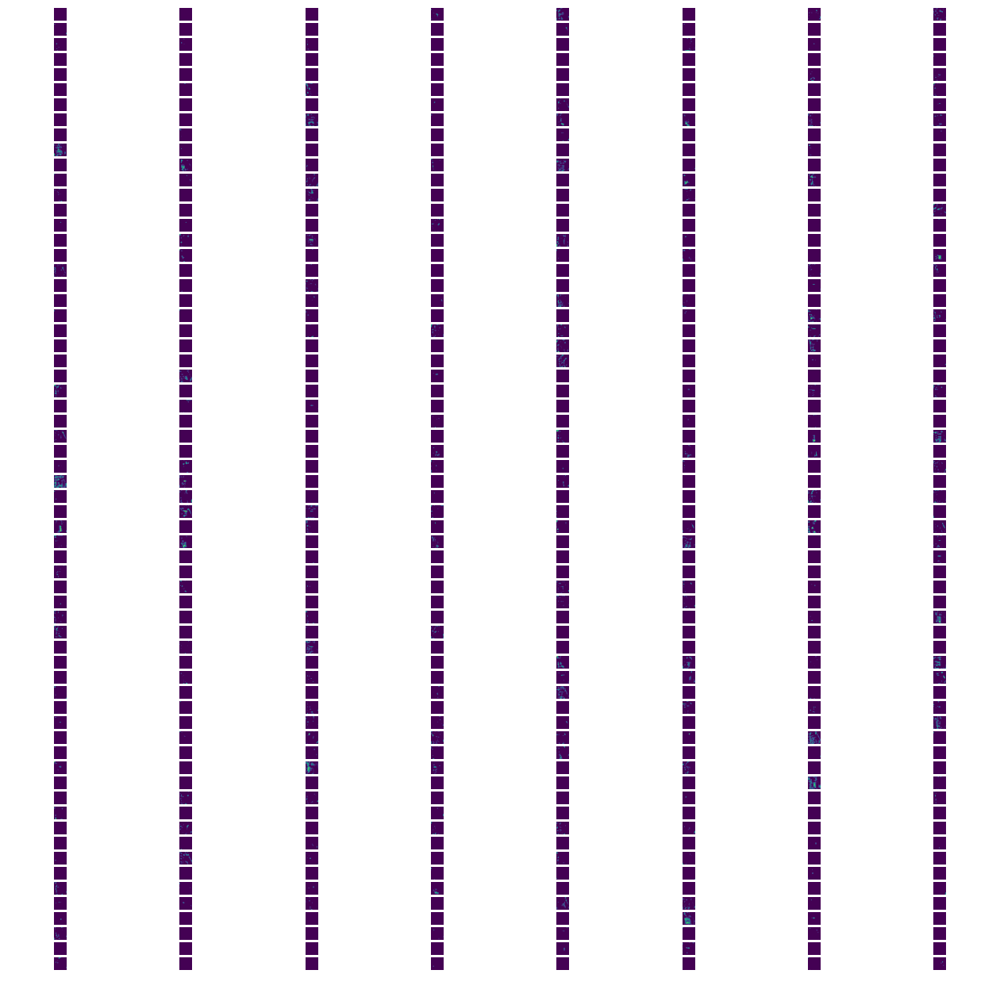

Visualizing feature maps for layer: block4_conv2
1/1 [==============================] - 0s 168ms/step


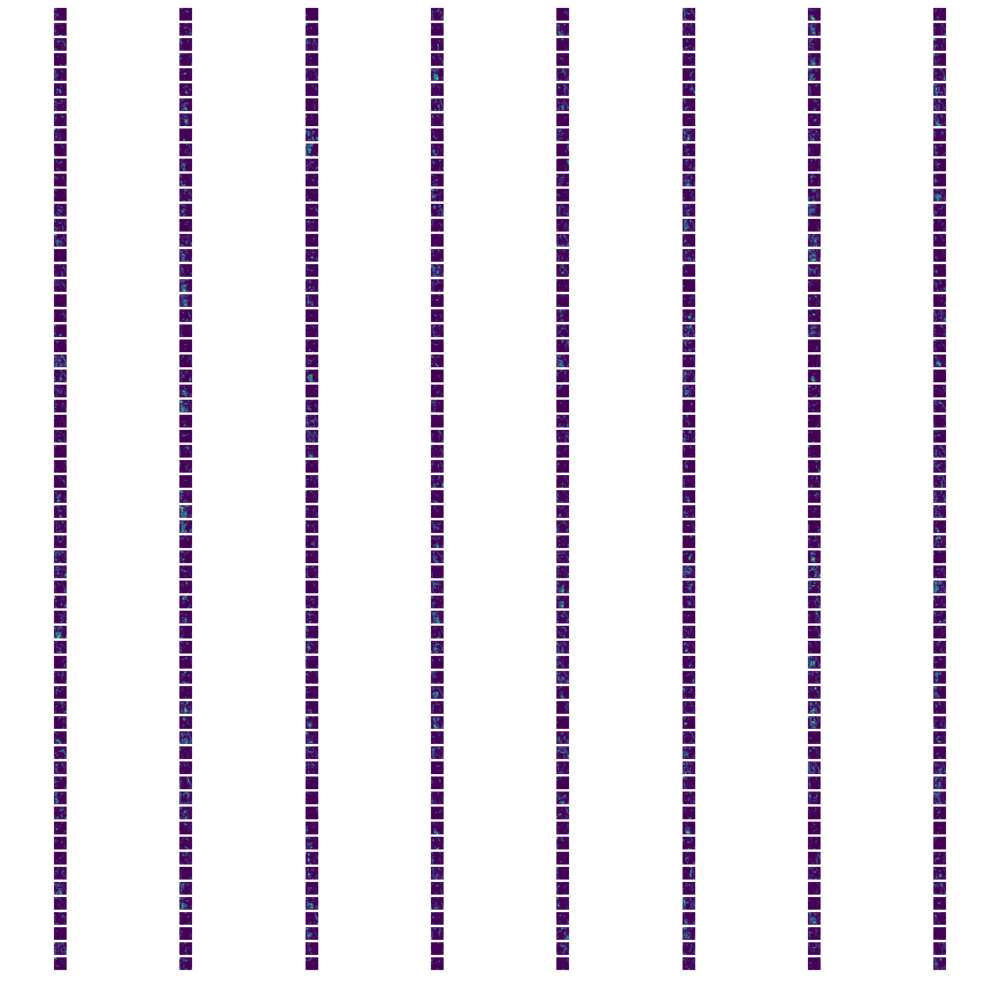

Visualizing feature maps for layer: block4_conv3
1/1 [==============================] - 0s 203ms/step


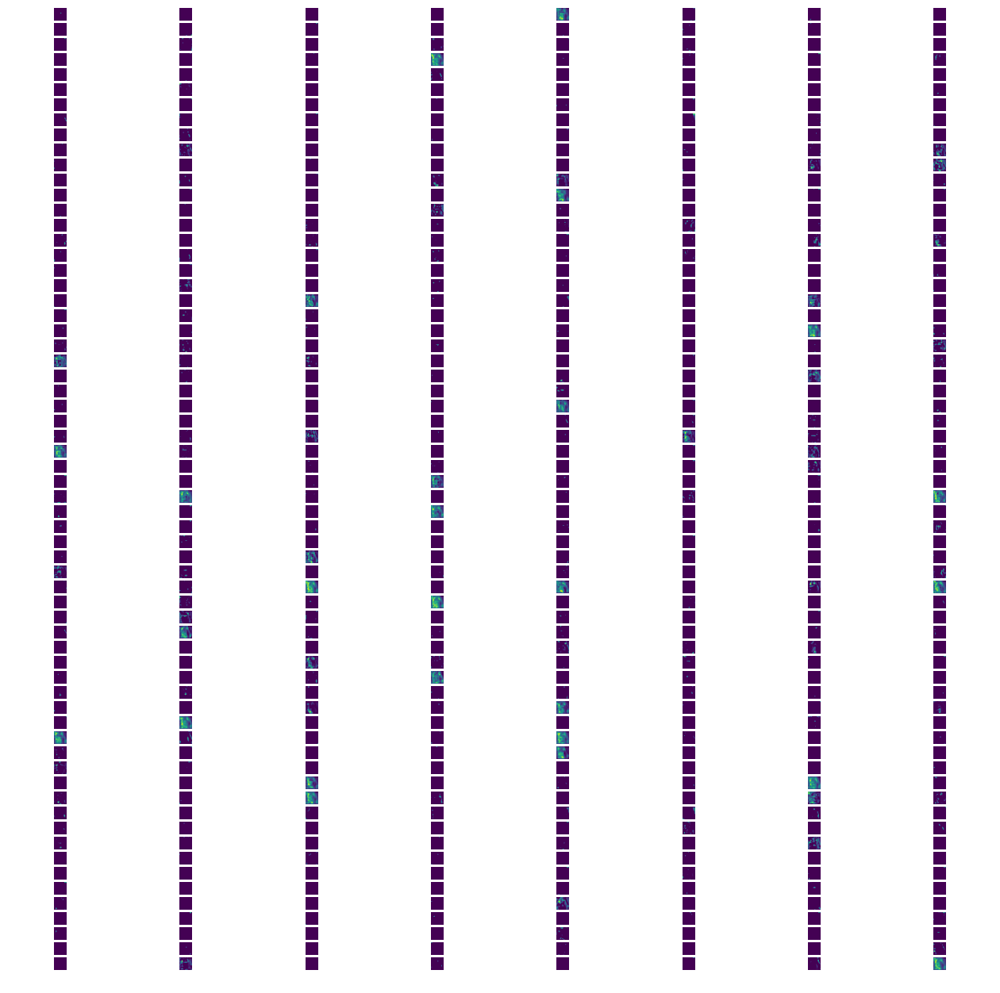

Visualizing feature maps for layer: block5_conv1
1/1 [==============================] - 0s 164ms/step


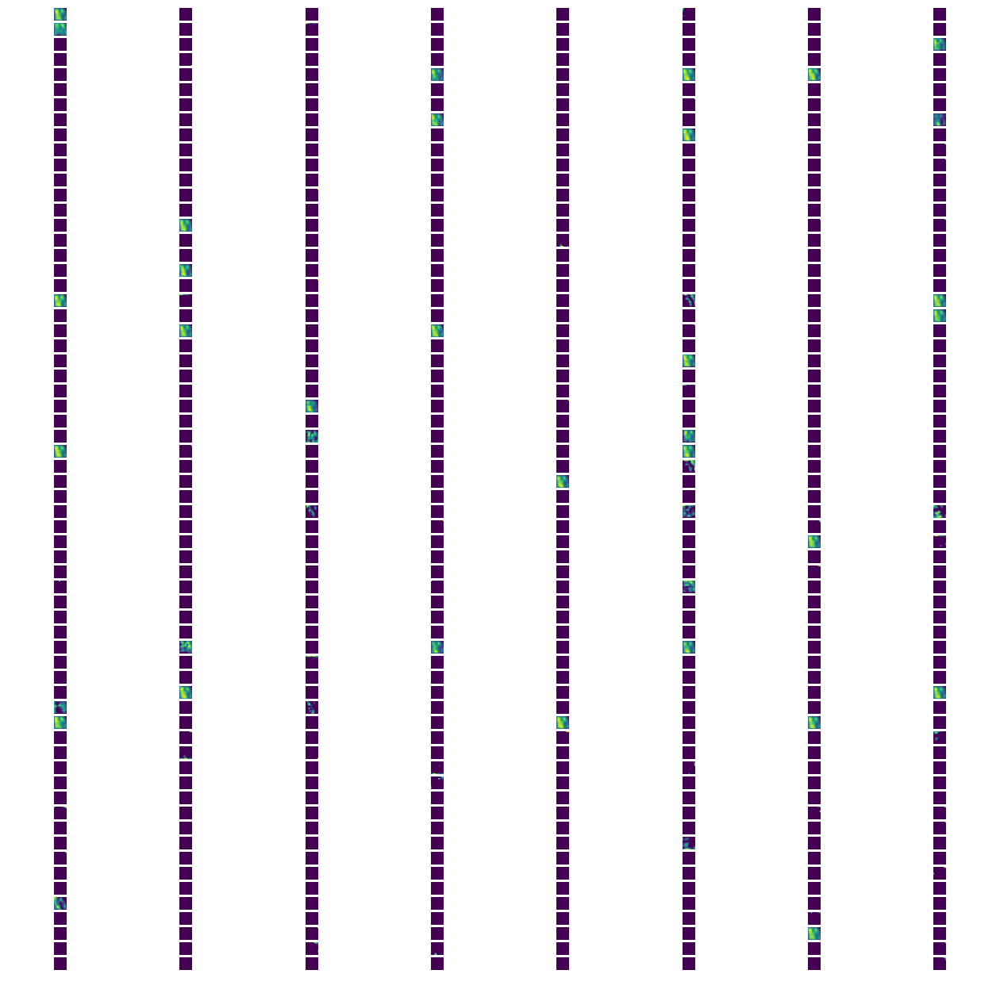

Visualizing feature maps for layer: block5_conv2
1/1 [==============================] - 0s 178ms/step


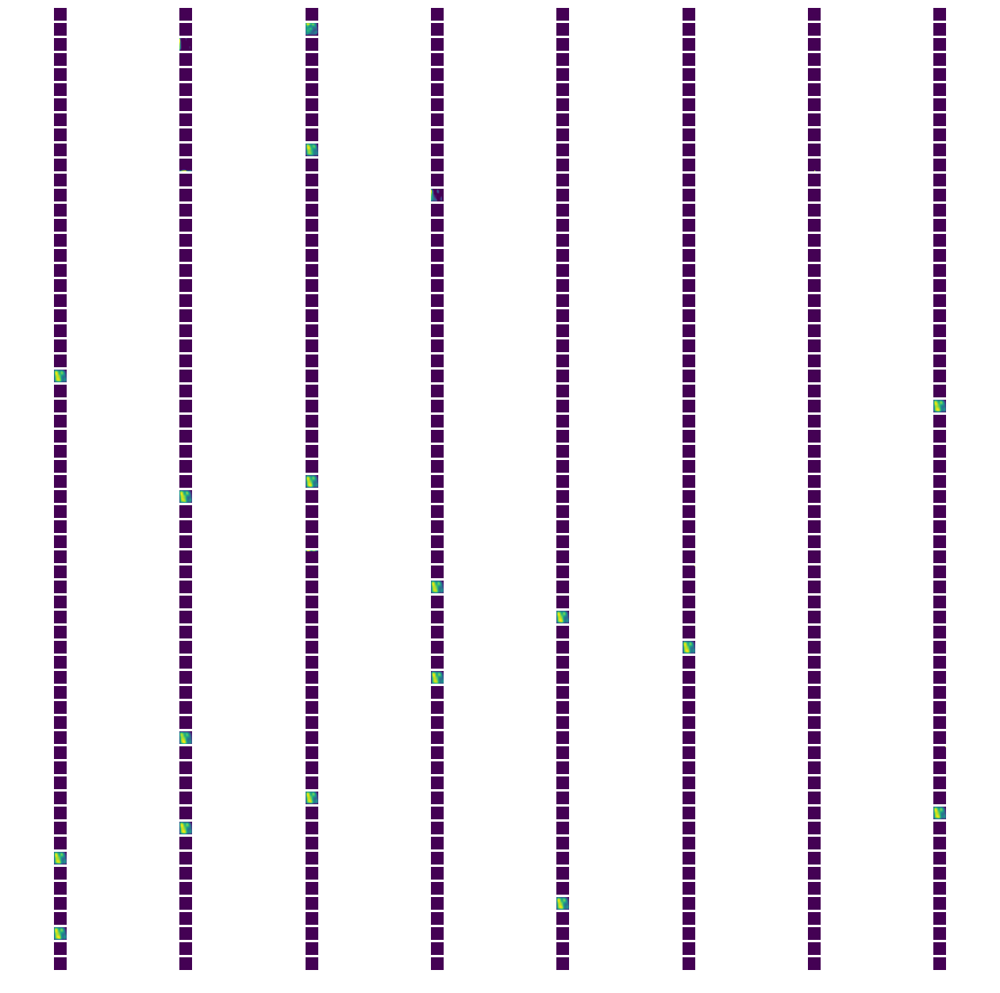

Visualizing feature maps for layer: block5_conv3
1/1 [==============================] - 0s 192ms/step


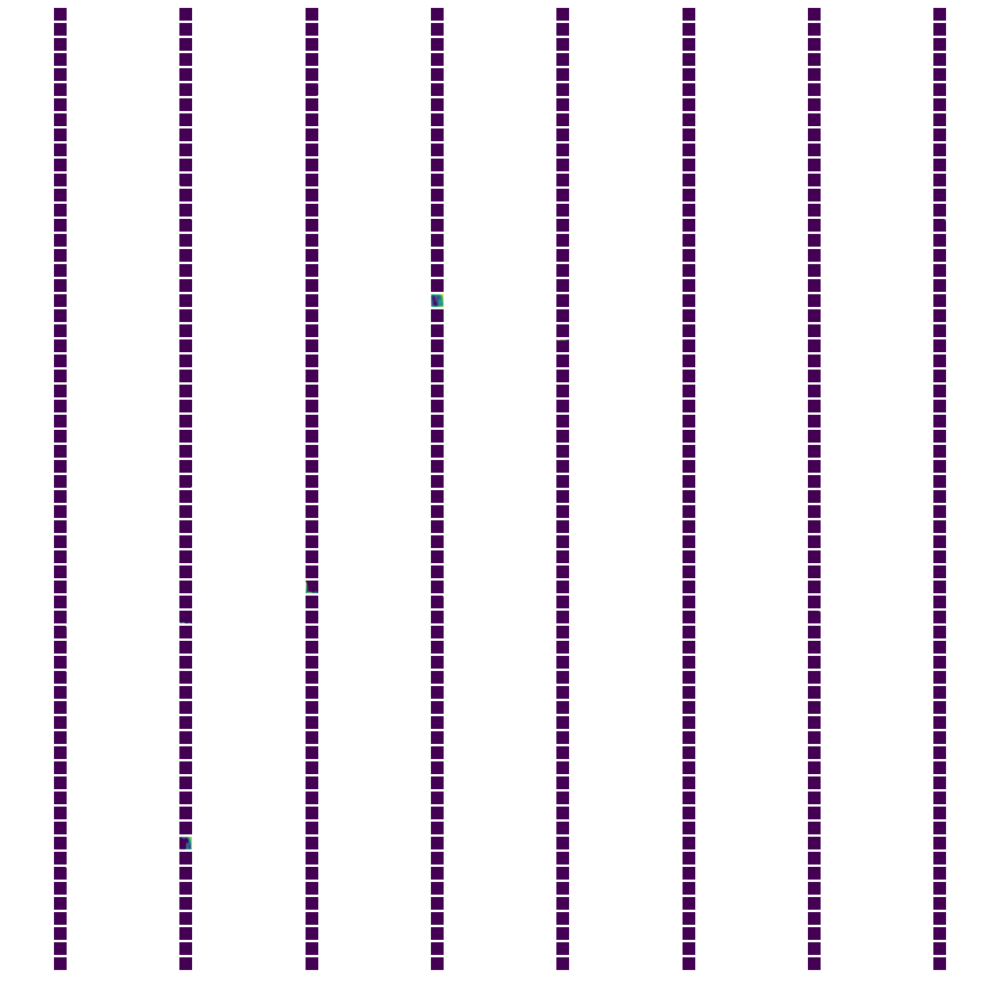

In [13]:

# Function to visualize feature maps for a given layer and input image
def visualize_feature_maps(model, layer_name, input_image):
    # Get the layer by name
    layer_to_visualize = model.get_layer(layer_name)

    # Create a new model that outputs the feature maps of the chosen layer
    feature_map_model = Model(inputs=model.input, outputs=layer_to_visualize.output)

    # Expand the dimensions of the input image to match the model's input shape
    input_image = np.expand_dims(input_image, axis=0)

    # Get the feature maps for the input image
    feature_maps = feature_map_model.predict(input_image)

    # Plot the feature maps
    num_feature_maps = feature_maps.shape[-1]
    cols = 8  # Number of columns for subplots (adjust as needed)
    rows = num_feature_maps // cols + 1
    fig, axes = plt.subplots(rows, cols, figsize=(16, 16))

    for i in range(num_feature_maps):
        row_idx = i // cols
        col_idx = i % cols
        ax = axes[row_idx, col_idx]
        feature_map = feature_maps[0, :, :, i]
        ax.imshow(feature_map, cmap='viridis')
        ax.axis('off')

    # Hide any empty subplots
    for i in range(num_feature_maps, rows * cols):
        row_idx = i // cols
        col_idx = i % cols
        axes[row_idx, col_idx].axis('off')

    plt.show()

# Choose an input image to visualize
input_image_to_visualize = train_data[0]  # Change this to the image you want to visualize

# Loop through all convolutional layers in the model
for layer in model.layers:
    if 'conv' in layer.name:
        print(f"Visualizing feature maps for layer: {layer.name}")
        visualize_feature_maps(model, layer.name, input_image_to_visualize)

1/1 [==============================] - 0s 237ms/step
Class Name: Burger King


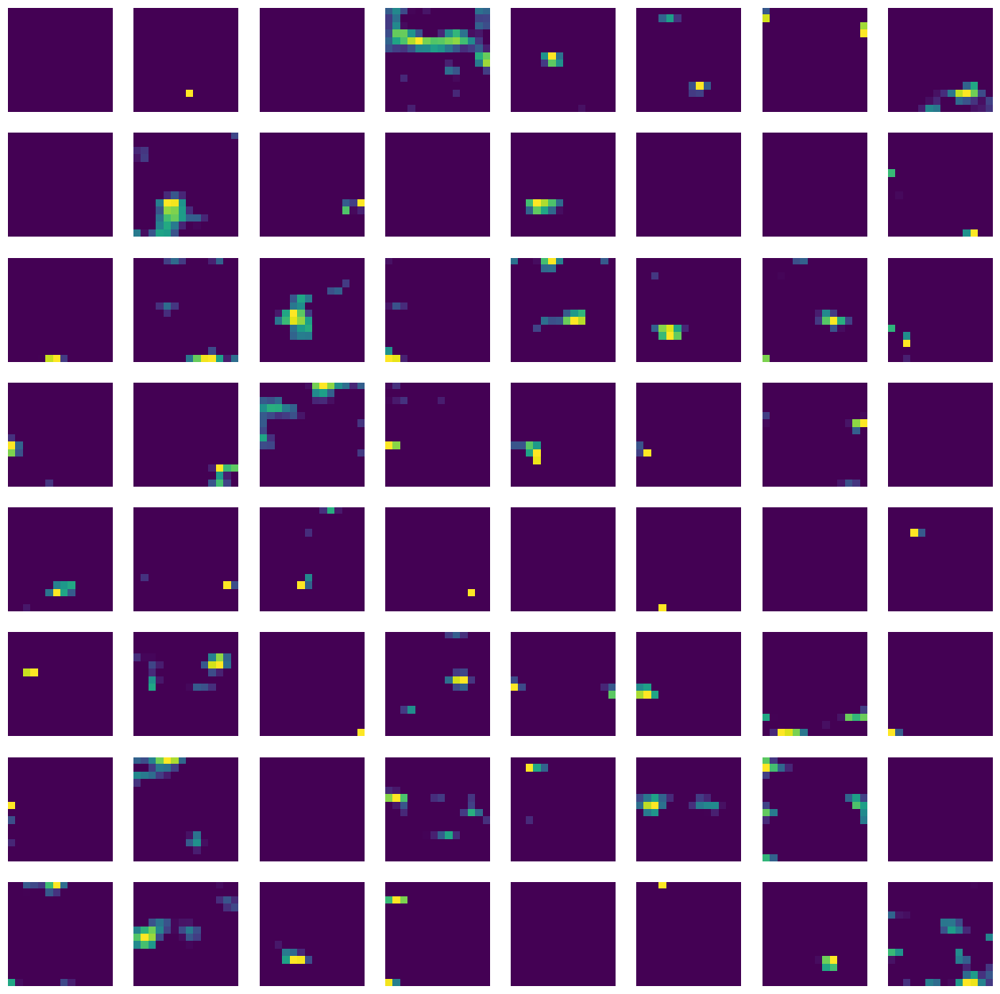

1/1 [==============================] - 0s 115ms/step
Class Name: KFC


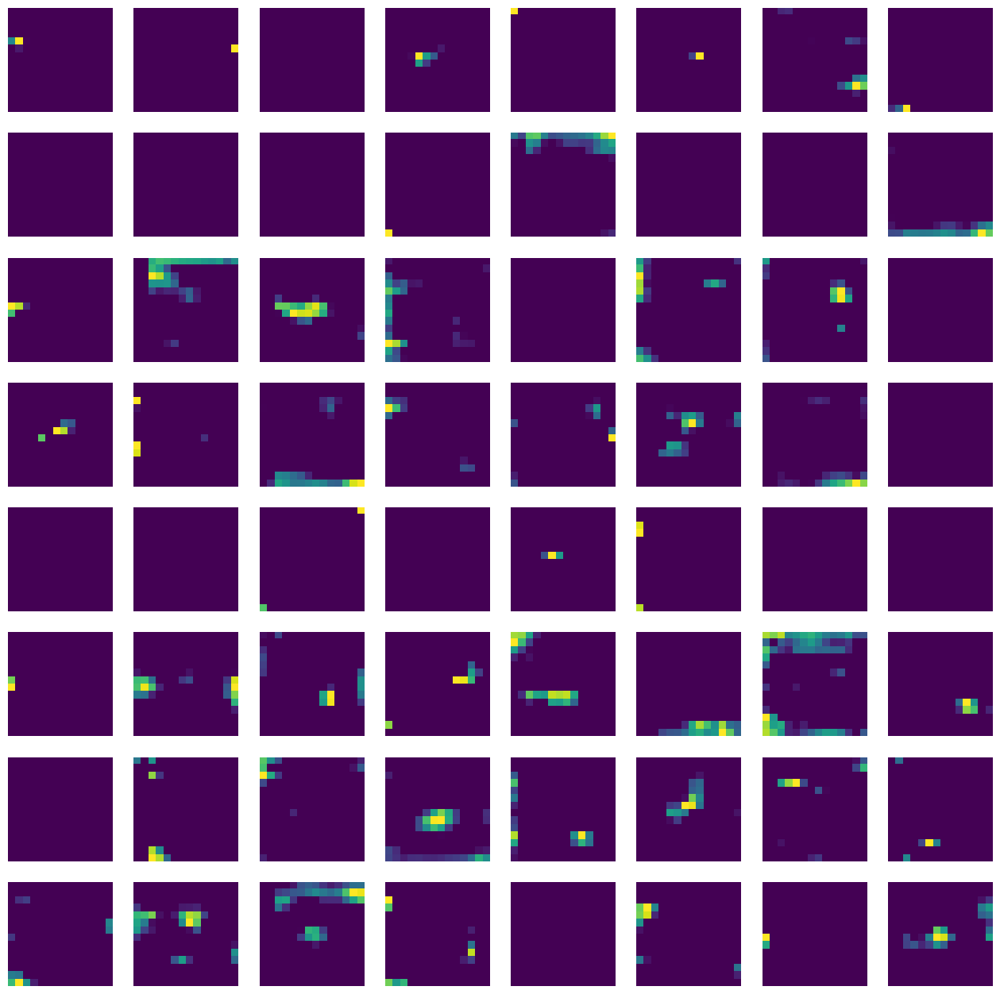

1/1 [==============================] - 0s 138ms/step
Class Name: McDonalds


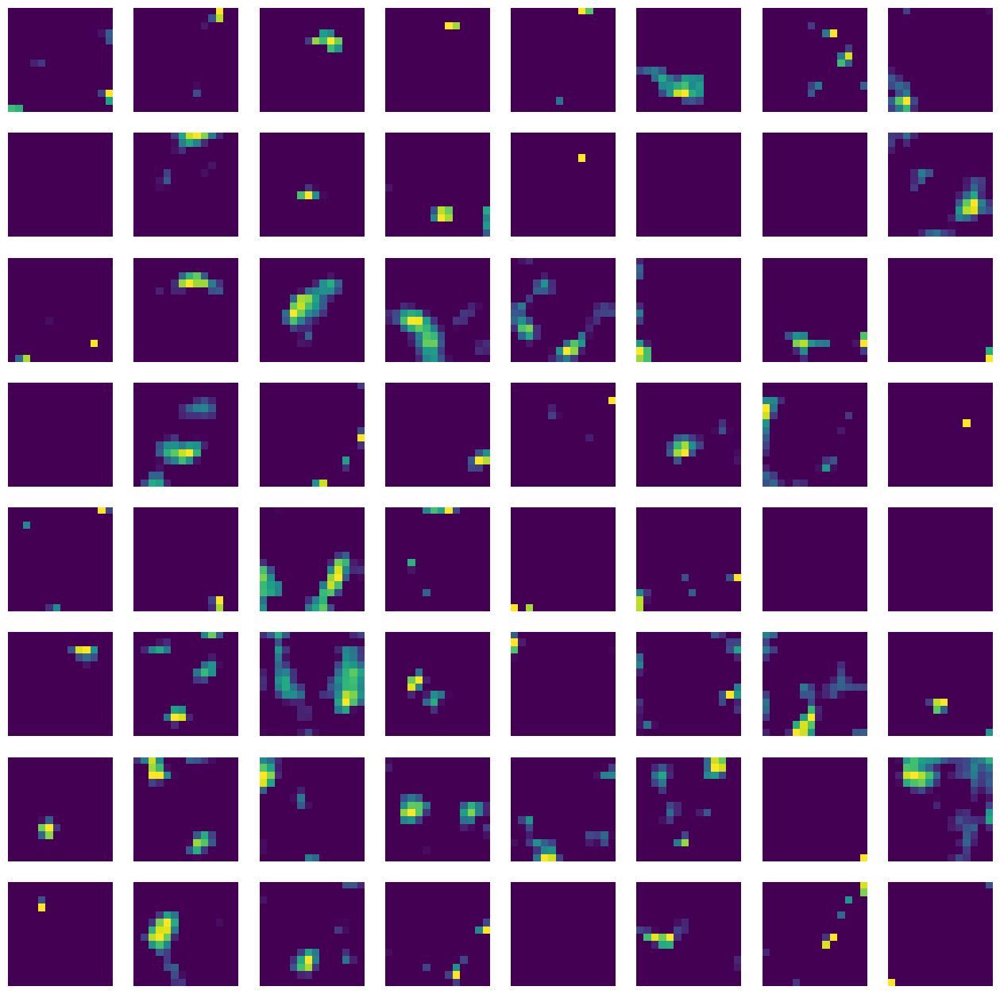

1/1 [==============================] - 0s 116ms/step
Class Name: Other


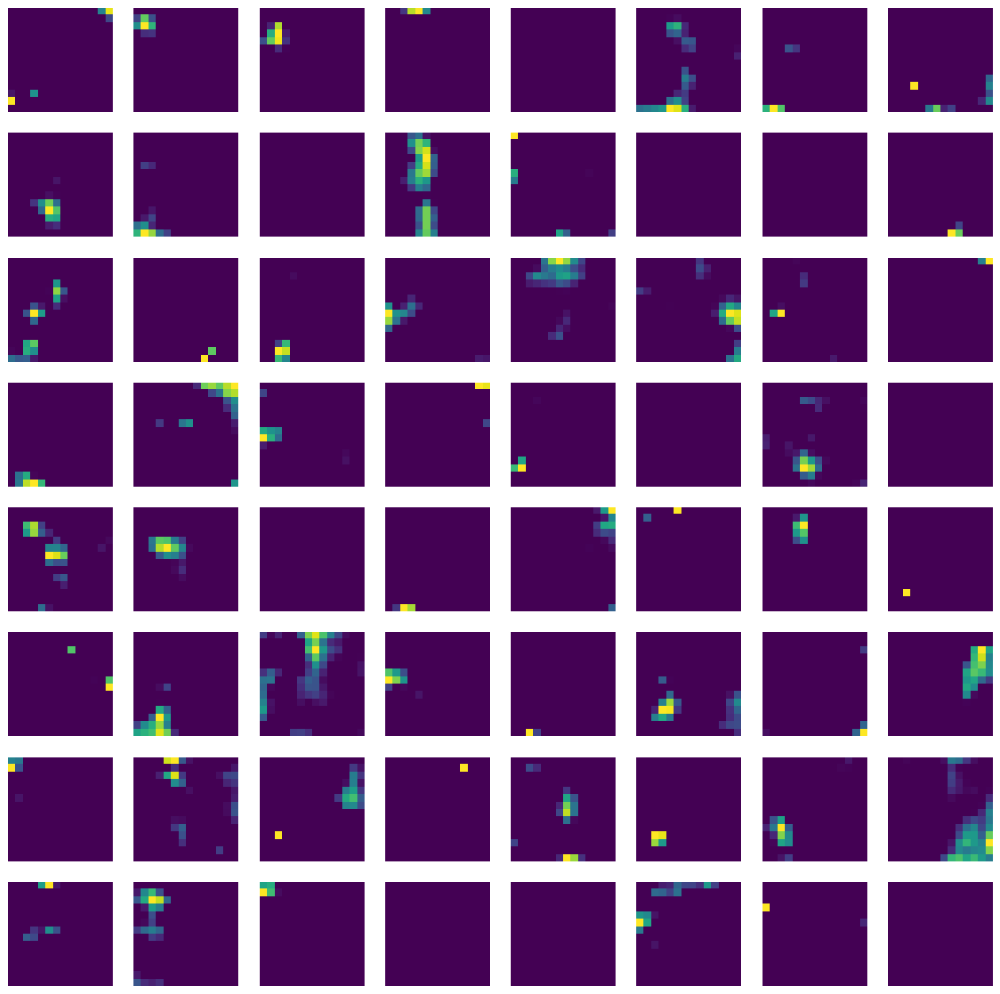

1/1 [==============================] - 0s 143ms/step
Class Name: Starbucks


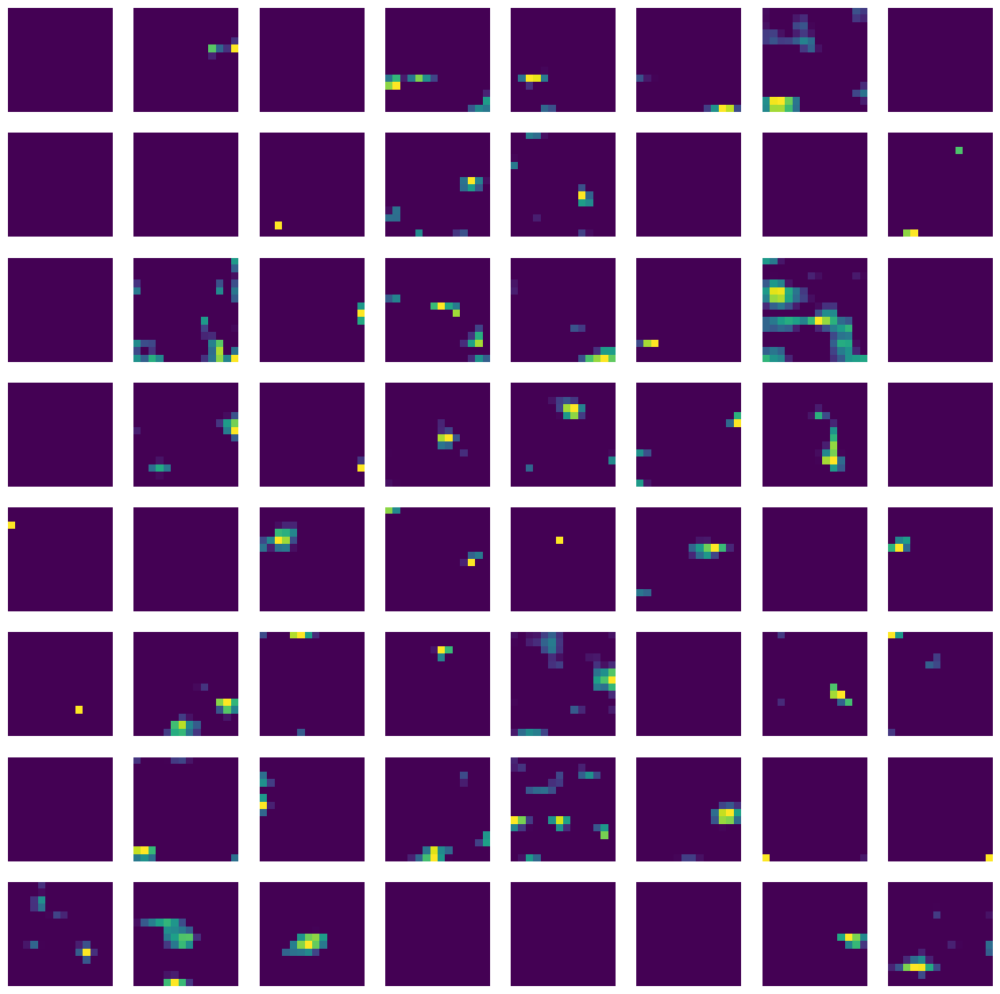

1/1 [==============================] - 0s 112ms/step
Class Name: Subway


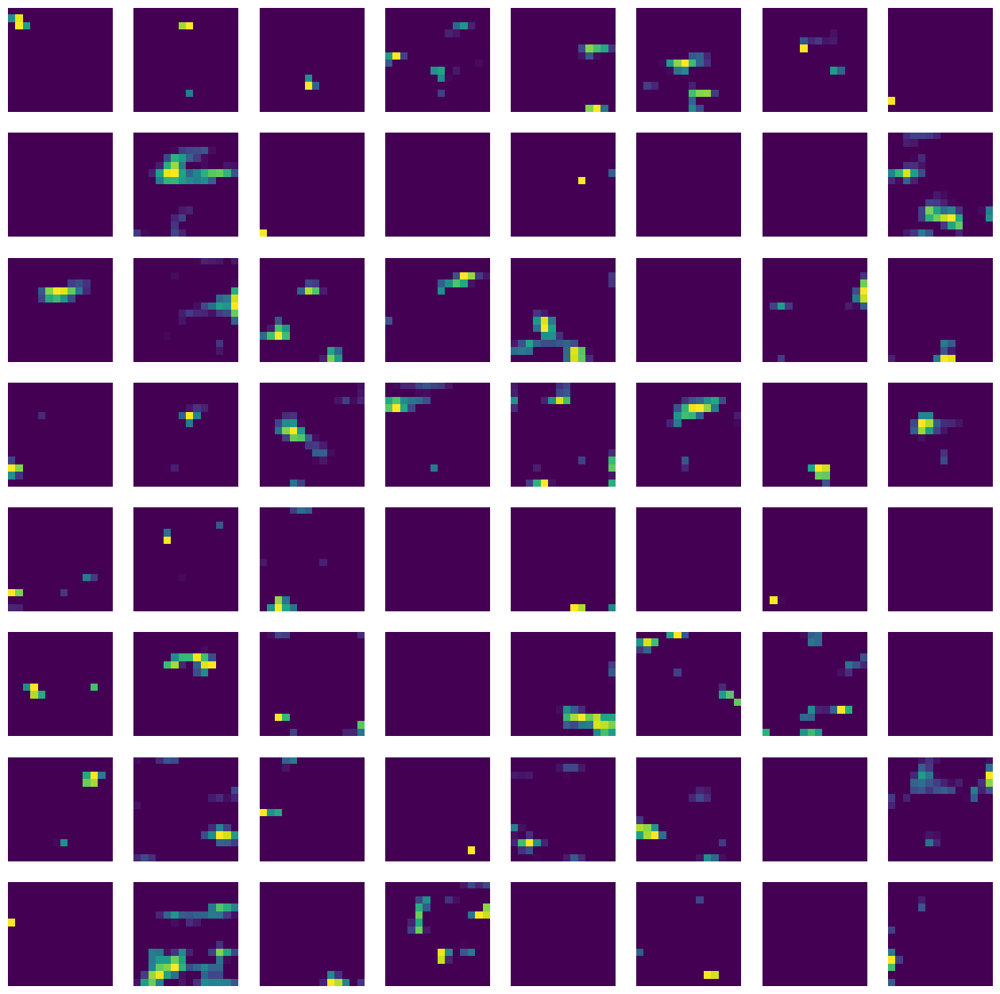

In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

# Load the pre-trained VGG16 model (or any other model you prefer)
base_model = VGG16(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('block5_conv3').output)

# Specify the path to the test directory with subfolders
test_directory = 'C:/Users/parit/Desktop/DLAssignment/logos3/test'

# Get a list of subfolders (class names) in the test directory
class_folders = [folder for folder in os.listdir(test_directory) if os.path.isdir(os.path.join(test_directory, folder))]

# Iterate through each subfolder (class)
for class_name in class_folders:
    # Get a list of image file names in the selected class subfolder
    class_directory = os.path.join(test_directory, class_name)
    image_files = [f for f in os.listdir(class_directory) if f.endswith('.jpg')]
    
    if image_files:
        # Select the first image in the list (you can change this to visualize different images)
        selected_image_file = image_files[0]

        # Load and preprocess the selected image
        img_path = os.path.join(class_directory, selected_image_file)
        img = image.load_img(img_path, target_size=(224, 224))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)

        # Get feature maps for the selected image
        feature_maps = model.predict(x)

        # Visualize the feature maps
        fig, axes = plt.subplots(8, 8, figsize=(16, 16))
        for i in range(8):
            for j in range(8):
                ax = axes[i, j]
                ax.imshow(feature_maps[0, :, :, i * 8 + j], cmap='viridis')
                ax.axis('off')

        # Print the class name (subfolder name)
        print(f"Class Name: {class_name}")
        plt.show()
    else:
        print(f"No image files found in the '{class_name}' subfolder.")


1/1 [==============================] - 0s 243ms/step


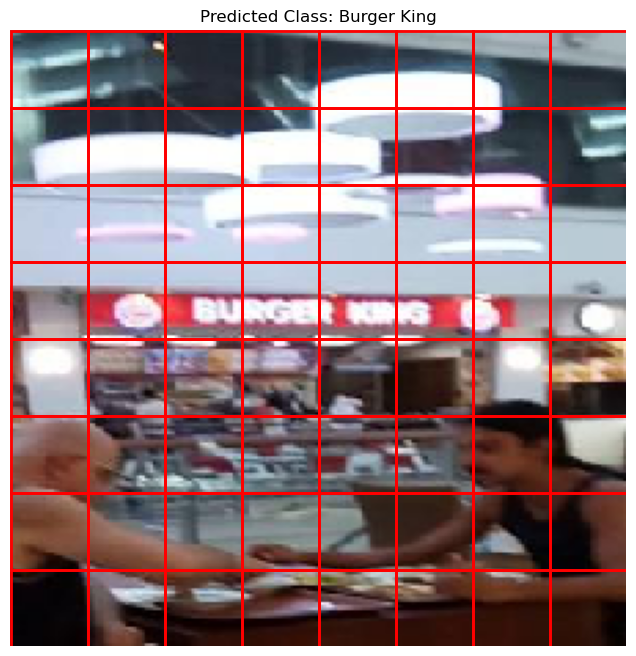

1/1 [==============================] - 0s 111ms/step


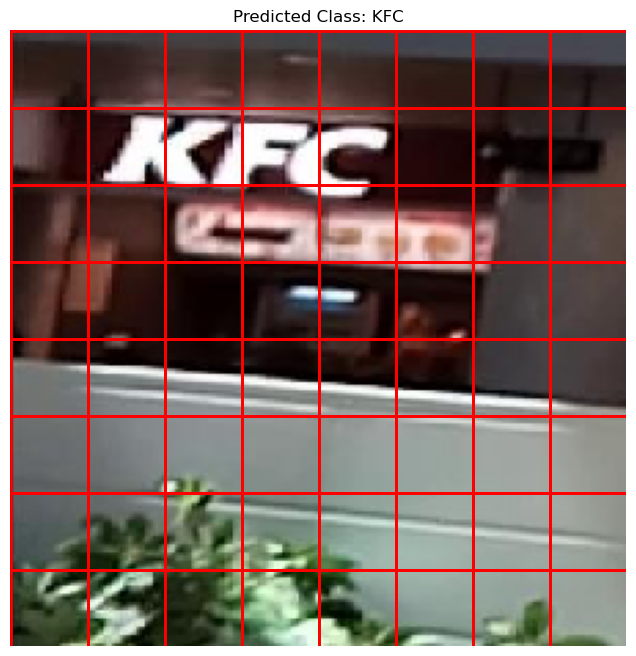

1/1 [==============================] - 0s 112ms/step


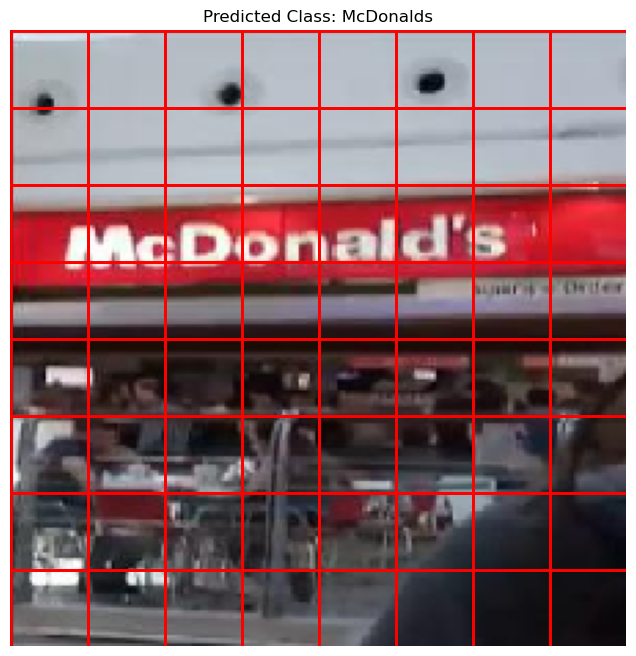

1/1 [==============================] - 0s 106ms/step


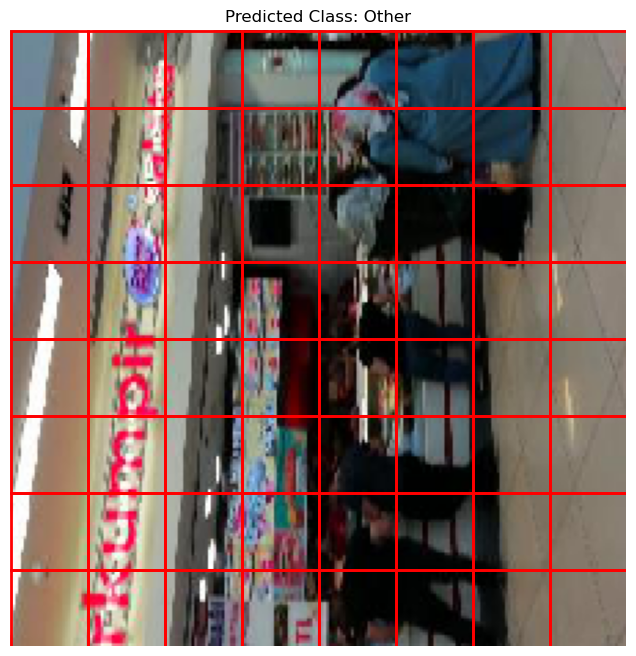

1/1 [==============================] - 0s 103ms/step


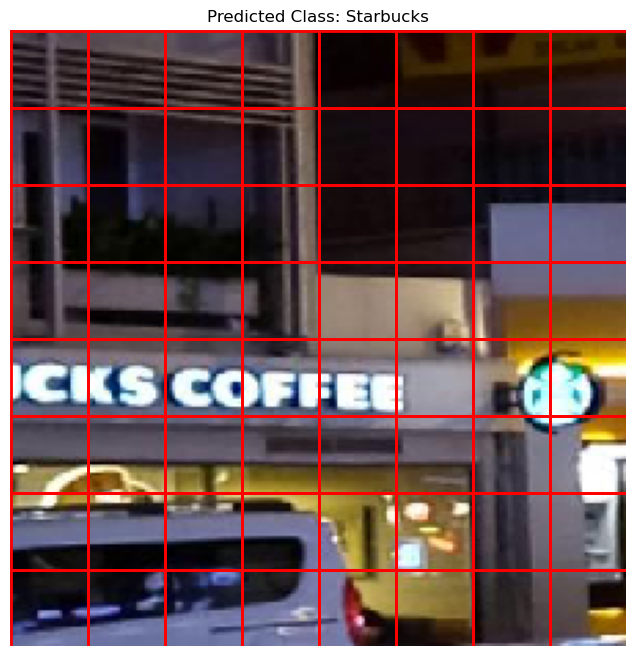

1/1 [==============================] - 0s 106ms/step


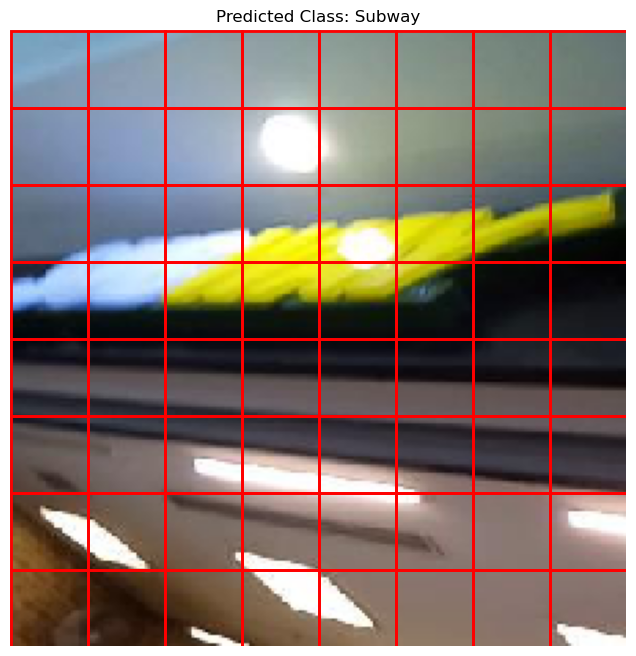

In [18]:
import random 

# Load the pre-trained VGG16 model (or any other model you prefer)
base_model = VGG16(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('block5_conv3').output)

# Specify the path to the test directory with subfolders
test_directory = 'C:/Users/parit/Desktop/DLAssignment/logos3/test'

# Get a list of subfolders (class names) in the test directory
class_folders = [folder for folder in os.listdir(test_directory) if os.path.isdir(os.path.join(test_directory, folder))]

# Iterate through each subfolder (class)
for class_name in class_folders:
    # Get a list of image file names in the selected class subfolder
    class_directory = os.path.join(test_directory, class_name)
    image_files = [f for f in os.listdir(class_directory) if f.endswith('.jpg')]
    
    if image_files:
        # Randomly select one image from the list
        selected_image_file = random.choice(image_files)

        # Load and preprocess the selected image
        img_path = os.path.join(class_directory, selected_image_file)
        img = image.load_img(img_path, target_size=(224, 224))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)

        # Get feature maps for the selected image
        feature_maps = model.predict(x)

        # Display the original image with the predicted class label and accuracy
        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        plt.title(f'Predicted Class: {class_name}')
        plt.axis('off')

        # Show the feature maps as an overlay
        for i in range(8):
            for j in range(8):
                plt.gca().add_patch(plt.Rectangle((j * 28, i * 28), 28, 28, fill=False, edgecolor='red', lw=2))

        plt.show()
    else:
        print(f"No image files found in the '{class_name}' subfolder.")


the final output takes random pictures from the given dataset in every run